# Determining Spotify Playlist Genres From Song Data

## To run the notebook:
Make sure spotify_songs.csv is in the current directory and not in a sub directory.\
Note: There may be times where you need to restart the kernel to use updated packages.\
Note: The SVM model may take a while to fully load. 

In [1]:
import pandas as pd
'''
list of all variable names:

['track_id', 'track_name', 'track_artist', 'track_popularity', 
'track_album_id', 'track_album_name', 'track_album_release_date', 
'playlist_name', 'playlist_id', 'playlist_genre', 'playlist_subgenre', 
'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 
'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 
'duration_ms']
'''
spotify = pd.read_csv('spotify_songs.csv', low_memory = False)

#divide by the 5 genres
pop = spotify[spotify['playlist_genre'] == 'pop']
rb = spotify[spotify['playlist_genre'] == 'r&b']
latin = spotify[spotify['playlist_genre'] == 'latin']
rap = spotify[spotify['playlist_genre'] == 'rap']
edm = spotify[spotify['playlist_genre'] == 'edm']

In [2]:
#pop describe
pop[['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 
     'valence', 'tempo']].describe()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,valence,tempo
count,5507.000000,5507.000000,5507.000000,5507.000000,5507.000000,5507.000000,5507.000000,5507.000000,5507.000000,5507.000000
mean,0.639302,0.701028,5.318867,-6.315328,0.588161,0.073991,0.170794,0.059876,0.503521,120.743178
std,0.128221,0.171084,3.639196,2.622209,0.492211,0.067822,0.219353,0.183641,0.220472,24.748446
min,0.098500,0.008140,0.000000,-26.279000,0.000000,0.022800,0.000002,0.000000,0.027600,35.477000
25%,0.563000,0.594000,2.000000,-7.508000,0.000000,0.036900,0.017500,0.000000,0.339000,102.987500
50%,0.652000,0.727000,5.000000,-5.835000,1.000000,0.049000,0.076700,0.000011,0.500000,120.017000
75%,0.729000,0.830000,9.000000,-4.569000,1.000000,0.079100,0.231000,0.002135,0.668000,130.089000
max,0.979000,0.999000,11.000000,-0.700000,1.000000,0.869000,0.992000,0.982000,0.981000,212.137000


In [3]:
#r&b describe
rb[['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 
     'valence', 'tempo']].describe()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,valence,tempo
count,5431.000000,5431.000000,5431.000000,5431.000000,5431.000000,5431.000000,5431.000000,5431.000000,5431.000000,5431.000000
mean,0.670179,0.590934,5.400479,-7.864848,0.521451,0.116792,0.259904,0.028920,0.531231,114.222156
std,0.138213,0.179407,3.596447,2.891189,0.499586,0.107182,0.256324,0.121776,0.225883,28.638985
min,0.140000,0.011800,0.000000,-34.283000,0.000000,0.022400,0.000025,0.000000,0.036600,46.169000
25%,0.584000,0.469000,2.000000,-9.397000,0.000000,0.041900,0.049000,0.000000,0.353500,92.977000
50%,0.689000,0.596000,6.000000,-7.420000,1.000000,0.067900,0.165000,0.000005,0.542000,108.744000
75%,0.771000,0.721000,9.000000,-5.832000,1.000000,0.158000,0.412500,0.000586,0.709000,129.931500
max,0.977000,0.995000,11.000000,-0.478000,1.000000,0.918000,0.989000,0.969000,0.990000,214.516000


In [4]:
#latin describe
latin[['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 
     'valence', 'tempo']].describe()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,valence,tempo
count,5155.000000,5155.000000,5155.000000,5155.000000,5155.000000,5155.000000,5155.000000,5155.000000,5155.000000,5155.000000
mean,0.713287,0.708312,5.483996,-6.264455,0.561979,0.102653,0.210920,0.044447,0.605510,118.622354
std,0.114974,0.152308,3.636293,2.865150,0.496192,0.087729,0.213611,0.168453,0.222289,29.130579
min,0.077100,0.000175,0.000000,-46.448000,0.000000,0.023200,0.000036,0.000000,0.000010,48.718000
25%,0.655000,0.620000,2.000000,-7.406500,0.000000,0.043600,0.044500,0.000000,0.443500,95.989000
50%,0.729000,0.729000,6.000000,-5.752000,1.000000,0.067400,0.139000,0.000002,0.628000,110.962000
75%,0.792500,0.821000,9.000000,-4.435500,1.000000,0.127000,0.309000,0.000329,0.784500,129.004000
max,0.979000,1.000000,11.000000,-0.046000,1.000000,0.662000,0.989000,0.994000,0.976000,239.440000


In [5]:
#rap describe
rap[['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 
     'valence', 'tempo']].describe()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,valence,tempo
count,5746.000000,5746.000000,5746.000000,5746.000000,5746.000000,5746.000000,5746.000000,5746.000000,5746.000000,5746.000000
mean,0.718353,0.650708,5.470936,-7.042269,0.521406,0.197506,0.192479,0.075997,0.505090,120.654908
std,0.136452,0.170340,3.697661,3.054460,0.499585,0.132444,0.218727,0.229977,0.224663,31.644504
min,0.150000,0.016100,0.000000,-26.207000,0.000000,0.024300,0.000002,0.000000,0.029200,38.985000
25%,0.634000,0.546000,2.000000,-8.391500,0.000000,0.078825,0.030000,0.000000,0.333000,92.773250
50%,0.737000,0.665000,6.000000,-6.507500,1.000000,0.177500,0.109000,0.000000,0.517000,119.987500
75%,0.819750,0.776000,9.000000,-5.047250,1.000000,0.290000,0.281000,0.000182,0.680000,145.041000
max,0.975000,0.999000,11.000000,0.642000,1.000000,0.877000,0.994000,0.974000,0.977000,211.644000


In [6]:
#edm describe
edm[['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 
     'valence', 'tempo']].describe()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,valence,tempo
count,6043.000000,6043.000000,6043.000000,6043.000000,6043.000000,6043.000000,6043.000000,6043.000000,6043.000000,6043.000000
mean,0.655041,0.802476,5.352143,-5.427445,0.520106,0.086695,0.081504,0.218578,0.400656,125.768024
std,0.123558,0.139415,3.557832,2.371431,0.499637,0.071058,0.145439,0.326492,0.226205,15.321600
min,0.162000,0.106000,0.000000,-19.563000,0.000000,0.023900,0.000003,0.000000,0.026900,60.045000
25%,0.576000,0.723000,2.000000,-6.554000,0.000000,0.043800,0.003770,0.000006,0.217000,123.011500
50%,0.659000,0.830000,6.000000,-4.961000,1.000000,0.059900,0.019300,0.003990,0.370000,127.056000
75%,0.741000,0.913000,8.000000,-3.842000,1.000000,0.098500,0.086950,0.411000,0.559000,128.037000
max,0.983000,0.998000,11.000000,1.135000,1.000000,0.624000,0.985000,0.987000,0.983000,219.991000


In [7]:
pip install seaborn



[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


# Figures (Scatter Plot, Histogram, Bar Chart, Pie Chart, Radar Chart)

# Scatter Plot

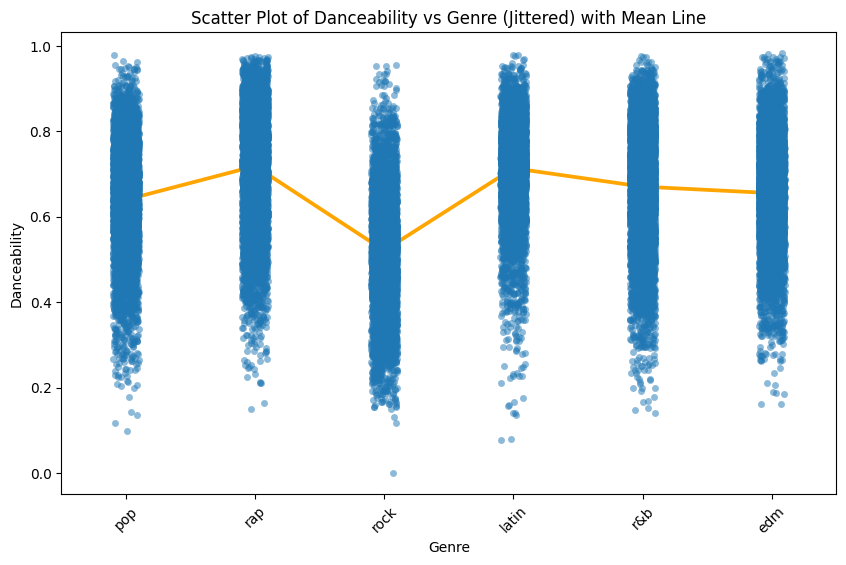

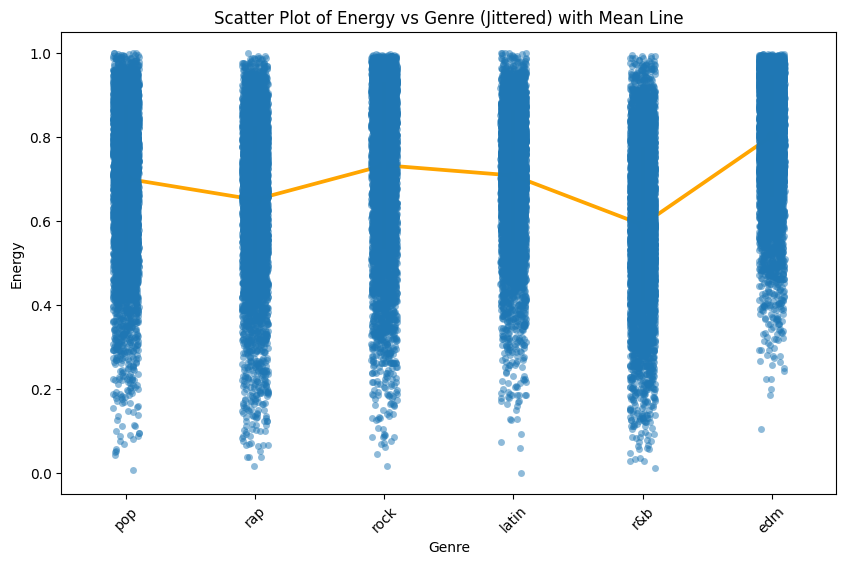

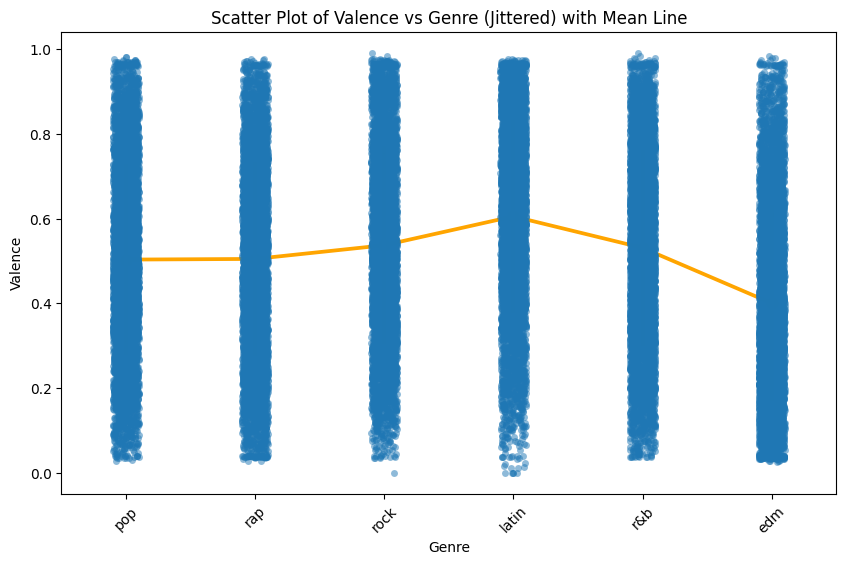

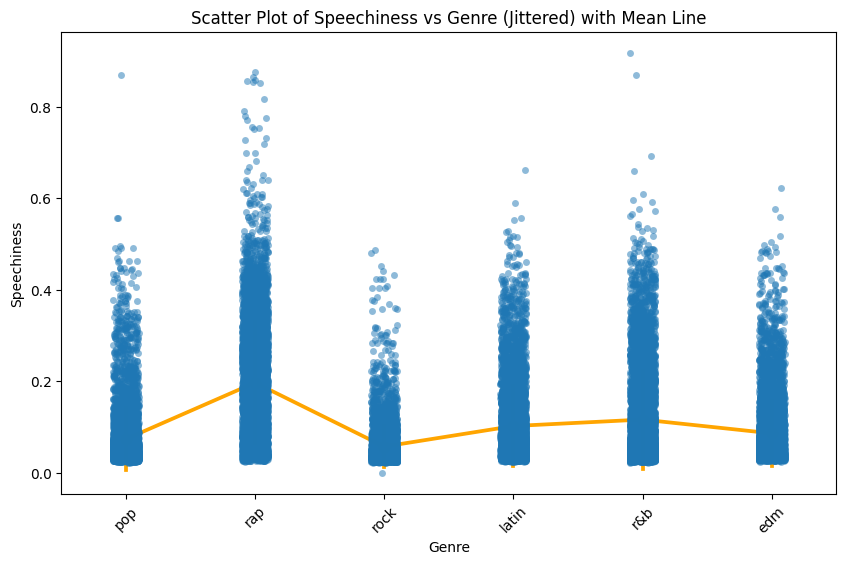

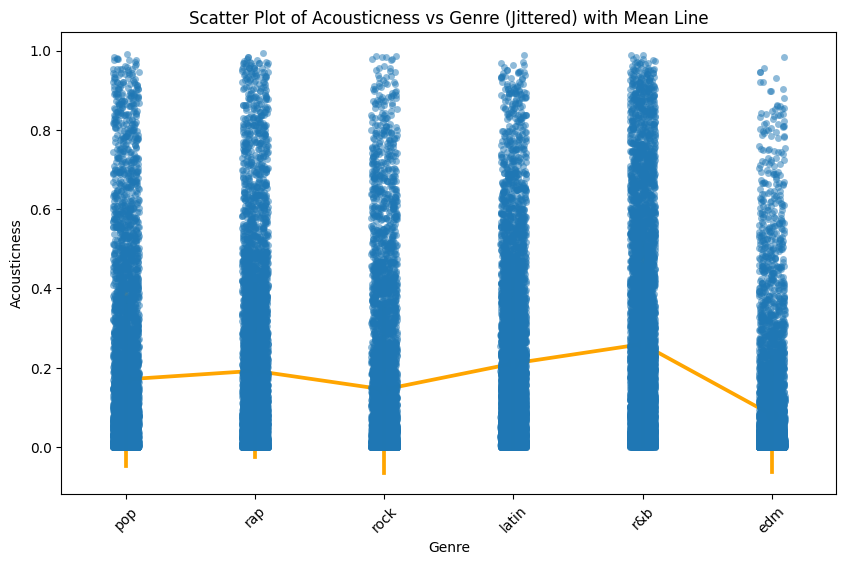

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt

spotify_data = pd.read_csv('spotify_songs.csv')
features = ['danceability', 'energy', 'valence', 'speechiness', 'acousticness']

for feature in features:
    plt.figure(figsize=(10, 6))
    sns.stripplot(data=spotify_data, x='playlist_genre', y=feature, jitter=True, alpha=0.5)
    sns.pointplot(data=spotify_data, x='playlist_genre', y=feature, color='orange', errorbar='sd', markers='o')
    plt.title(f'Scatter Plot of {feature.capitalize()} vs Genre (Jittered) with Mean Line')
    plt.xlabel('Genre')
    plt.ylabel(feature.capitalize())
    plt.xticks(rotation=45)
    
    plt.savefig(f'{feature}_vs_genre_scatterplot_with_mean.png', dpi=300, bbox_inches='tight')
    plt.show() 

# Histogram

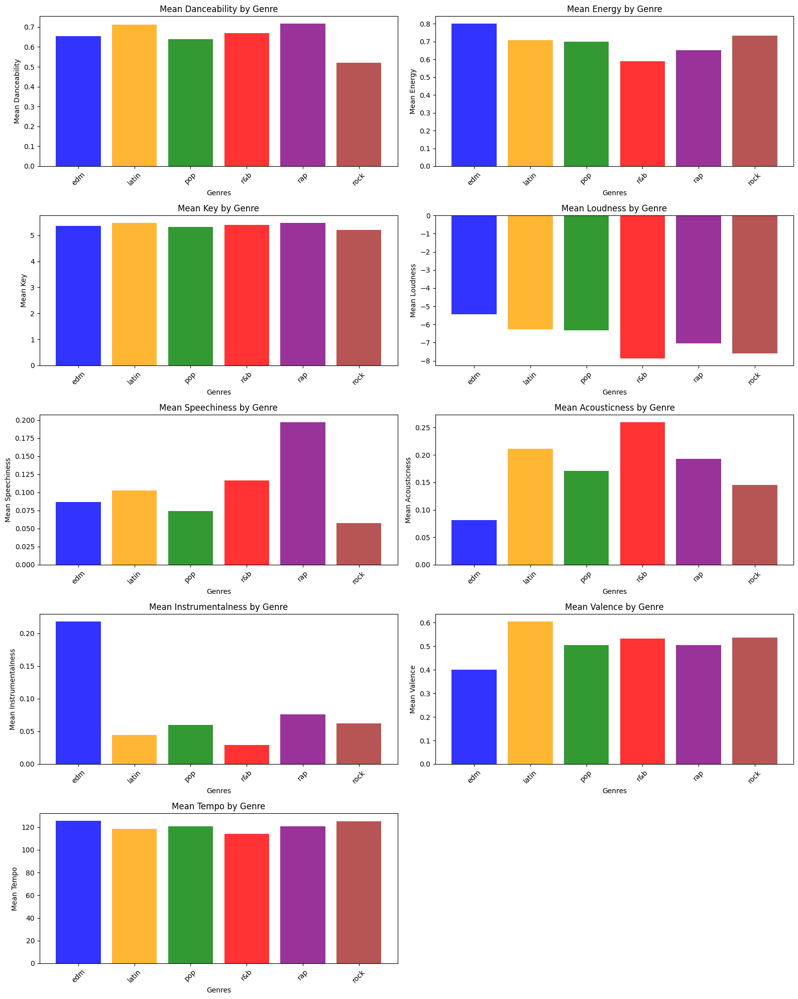

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

spotify_data = pd.read_csv('spotify_songs.csv')

features = ['danceability', 'energy', 'key', 'loudness', 
            'speechiness', 'acousticness', 'instrumentalness', 
            'valence', 'tempo']

genre_means = spotify_data.groupby('playlist_genre')[features].mean()
colors = ['blue', 'orange', 'green', 'red', 'purple', 'brown', 'pink', 'gray', 'cyan', 'magenta']
plt.figure(figsize=(16, 20))

for i, feature in enumerate(features):
    plt.subplot(5, 2, i + 1)  # Create a subplot grid

    means = genre_means[feature]
    genres = means.index

    bar_colors = colors[:len(genres)]

    
    plt.bar(genres, means, color=bar_colors, alpha=0.8)
    
    plt.title(f'Mean {feature.capitalize()} by Genre')
    plt.xlabel('Genres')
    plt.ylabel(f'Mean {feature.capitalize()}')
    plt.xticks(rotation=45)


plt.tight_layout()
plt.savefig('histogram_plot2.png', dpi=300, bbox_inches='tight')
plt.show()

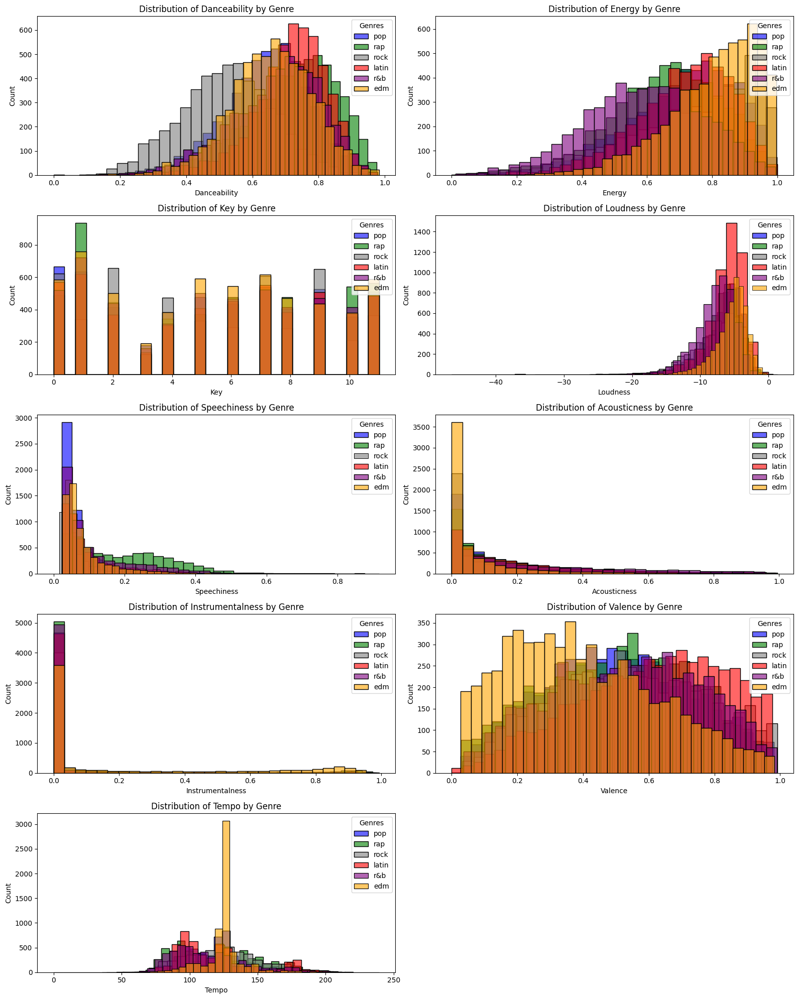

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
spotify_data = pd.read_csv('spotify_songs.csv')

# List of features to visualize
features = ['danceability', 'energy', 'key', 'loudness', 
            'speechiness', 'acousticness', 'instrumentalness', 
            'valence', 'tempo']

# Unique genres in the dataset
genres = spotify_data['playlist_genre'].unique()

# Define the colors for each genre
genre_colors = {
    'pop': 'blue',
    'r&b': 'purple',
    'latin': 'red',
    'rap': 'green',
    'edm': 'orange',
}

# Add a default color for unrecognized genres
for genre in genres:
    if genre not in genre_colors:
        genre_colors[genre] = 'gray'

# Create a histogram for each feature, grouped by genre
plt.figure(figsize=(16, 20))

for i, feature in enumerate(features):
    plt.subplot(5, 2, i + 1)  # Create a subplot grid
    
    # Plot histograms for each genre for the current feature
    for genre in genres:
        genre_data = spotify_data[spotify_data['playlist_genre'] == genre][feature]
        sns.histplot(genre_data, kde=False, bins=30, color=genre_colors[genre], 
                     label=genre, alpha=0.6)
    
    # Add title and labels
    plt.title(f'Distribution of {feature.capitalize()} by Genre')
    plt.xlabel(feature.capitalize())
    plt.ylabel('Count')
    plt.legend(title='Genres', loc='upper right')

# Adjust layout and display the plots
plt.tight_layout()
plt.savefig('histogram_plot.png', dpi=300, bbox_inches='tight')
plt.show()

# Bar Chart

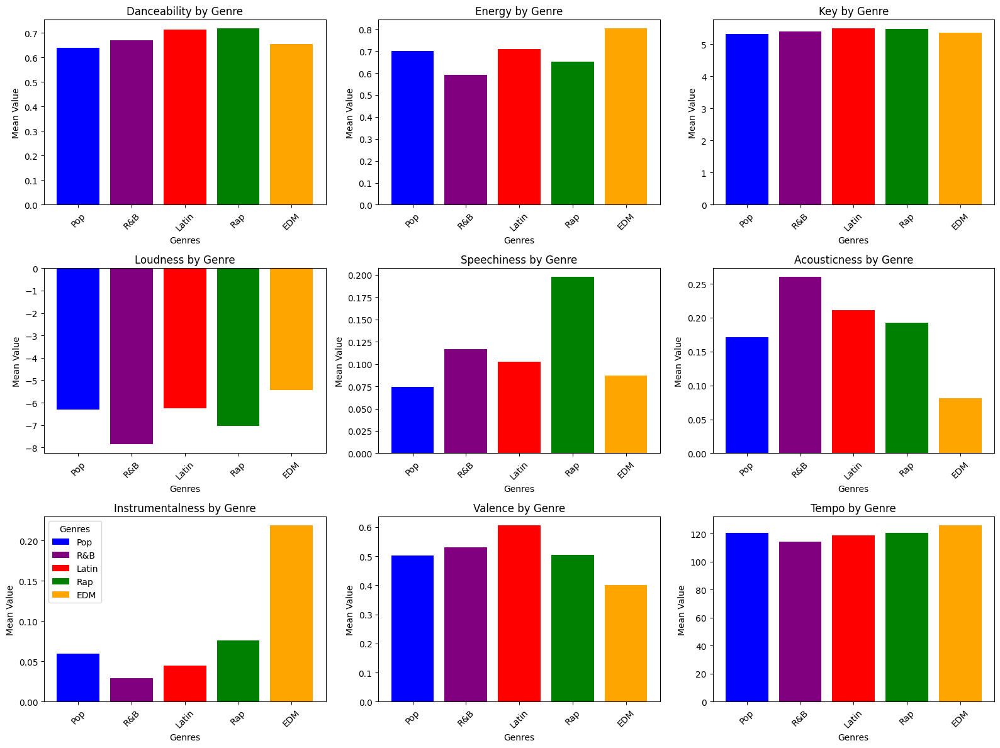

In [11]:
import matplotlib.pyplot as plt
import numpy as np

# List of features to visualize
features = ['danceability', 'energy', 'key', 'loudness', 'speechiness', 
            'acousticness', 'instrumentalness', 'valence', 'tempo']

# List of datasets and their genres
genres = {'Pop': pop, 'R&B': rb, 'Latin': latin, 'Rap': rap, 'EDM': edm}

# Predefined colors for genres
genre_colors = {
    'Pop': 'blue',
    'R&B': 'purple',
    'Latin': 'red',
    'Rap': 'green',
    'EDM': 'orange'
}

# Create a figure for the plots
plt.figure(figsize=(16, 12))

# Iterate over each feature to create a bar chart
for i, feature in enumerate(features):
    # Calculate the mean of the feature for each genre
    genre_means = [data[feature].mean() for data in genres.values()]
    
    # Create a subplot for each feature
    plt.subplot(3, 3, i + 1)  
    x_positions = np.arange(len(genres))  

    # Plot the bar chart with genre-specific colors
    plt.bar(x_positions, genre_means, color=[genre_colors[genre] for genre in genres.keys()])
    plt.xticks(x_positions, genres.keys(), rotation=45)
    plt.title(f'{feature.capitalize()} by Genre')
    plt.ylabel('Mean Value')
    plt.xlabel('Genres')

    # Add the legend on the `instrumentalness` chart
    if feature == 'instrumentalness':
        for genre, color in genre_colors.items():
            plt.bar(0, 0, color=color, label=genre)  
        plt.legend(title="Genres", loc='upper left')  # Legend in top-left corner

# Adjust layout and display the charts
plt.tight_layout()
plt.show()

# Pie Chart

In [12]:
#mylabels = ['pop', 'rock', 'edm', 'rap', 'latin', 'r&b'] 
mycolors = {
    'pop': '#8e412e',
    'rock': '#ba6f4d',
    'edm': '#e6cebc',
    'rap': '#a2a182',
    'latin': '#687259',
    'r&b': '#f4ece2'
}

genre_mapping = {
    0: 'pop',
    1: 'rock',
    2: 'edm',
    3: 'rap',
    4: 'latin',
    5: 'r&b'
}

import matplotlib.pyplot as plt
import numpy as np
import statistics

#var will be the variable we are looking at 
#thresh will be the thresholds we are looking at. it will differ for each variable depending on what the range of means is
#numcols and numrows can be used for variables that may have a need for more or less pie charts than normal
#normal amount of pie charts in this case would be a 2 x 3 grid
def make_pie_figs_above(var, thresh, numcols, numrows):
    #create the figure and axes
    fig, ax = plt.subplots(nrows = numrows, ncols = numcols, figsize = (12, 8))

    #loop over each thresh value to create pie charts
    #index is current thresh value in the list 
    #threshold is the actual thresh value
    for index, threshold in enumerate(thresh):
        #calculate row and column index for the subplot grid
        row, col = divmod(index, numcols)
    
        #filter data where var is above the threshold
        #uses copy() to avoid warnings about modifying dataframe
        filtered_data_above = spotify[spotify[var] > threshold].copy()
    
        #count number of occurences of each genre in the filtered data
        genre_counts_above = filtered_data_above['playlist_genre'].value_counts()

        #create genre names
        genre_names = [genre_mapping.get(genre, genre) for genre in genre_counts_above.index]

        #generate colors (from mycolors above). if not found will be grey 
        colors = [mycolors.get(genre, 'grey') for genre in genre_counts_above.index]
    
        #plot the pie chart for the current threshold
        ax[row][col].pie(genre_counts_above.values, labels = genre_counts_above.index, colors = colors, autopct = '%1.1f%%', startangle = 90)
        ax[row][col].set_title(f'{var} > {threshold}', fontsize=10)

    #adjust layout and show plot
    plt.tight_layout()
    plt.show()

def make_pie_figs_below(var, thresh, numcols, numrows):
    #create the figure and axes
    fig, ax = plt.subplots(nrows = numrows, ncols = numcols, figsize = (12, 8))

    #loop over each threshold to create pie charts
    for index, threshold in enumerate(thresh):
        #calculate row and column index for the subplot grid
        row, col = divmod(index, numcols)
    
        #filter data where var is above the threshold
        filtered_data_below = spotify[spotify[var] < threshold].copy()
    
        #count genre occurrences in the filtered data
        genre_counts_below = filtered_data_below['playlist_genre'].value_counts()

        #create genre names
        genre_names = [genre_mapping.get(genre, genre) for genre in genre_counts_below.index]

        #generate colors (from mycolors above). if not found will be grey 
        colors = [mycolors.get(genre, 'grey') for genre in genre_counts_below.index]
    
        #plot the pie chart for the current threshold
        ax[row][col].pie(genre_counts_below.values, labels=genre_counts_below.index, colors = colors, autopct='%1.1f%%', startangle=90)
        ax[row][col].set_title(f'{var} < {threshold}', fontsize=10)

    #adjust layout and show plot
    plt.tight_layout()
    plt.show()

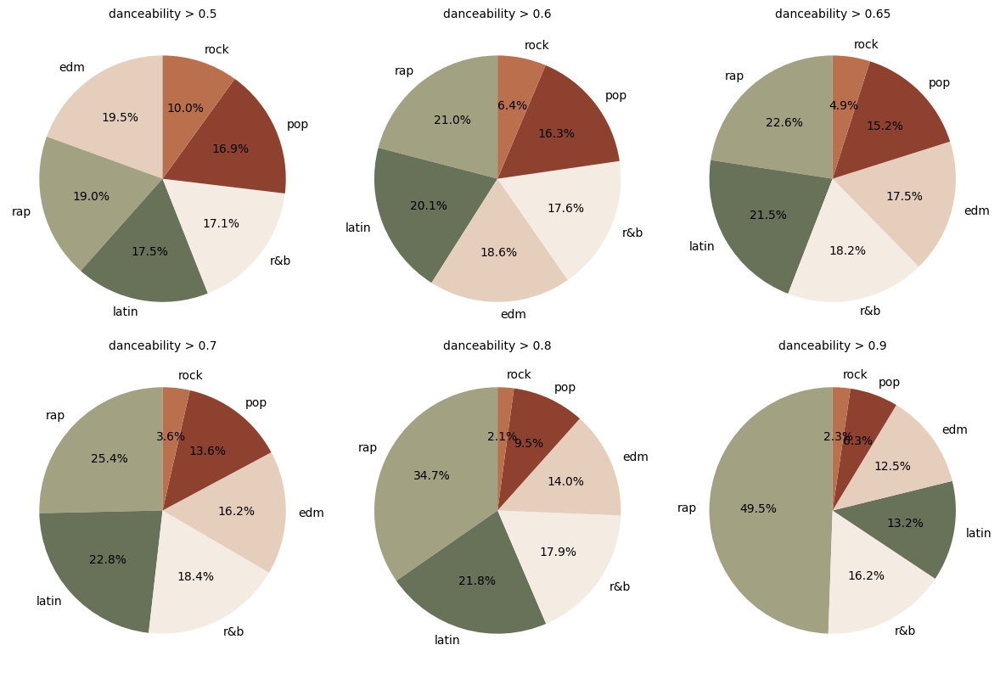

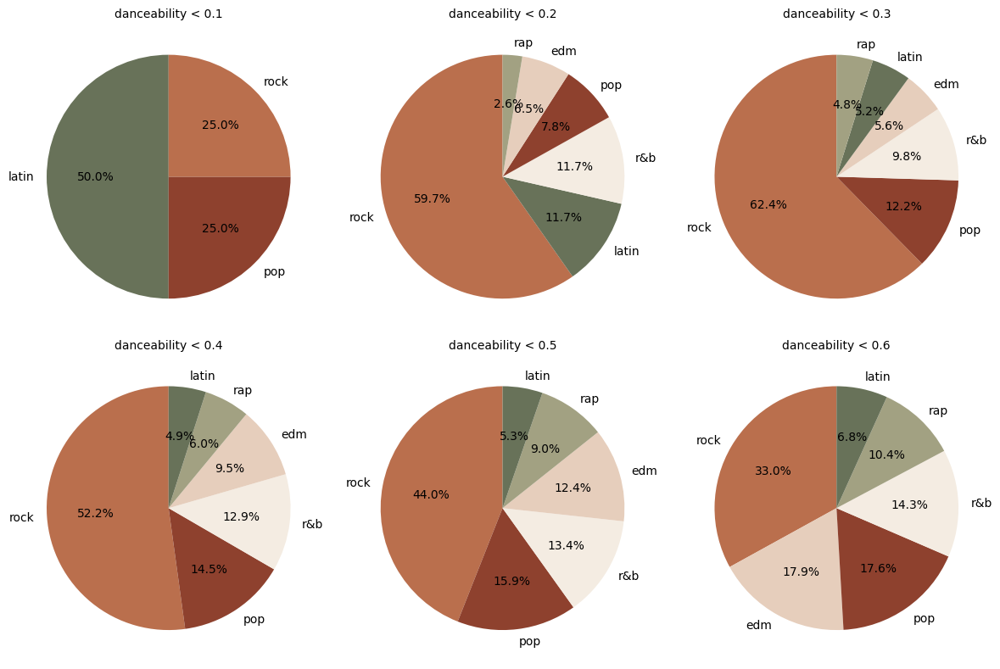

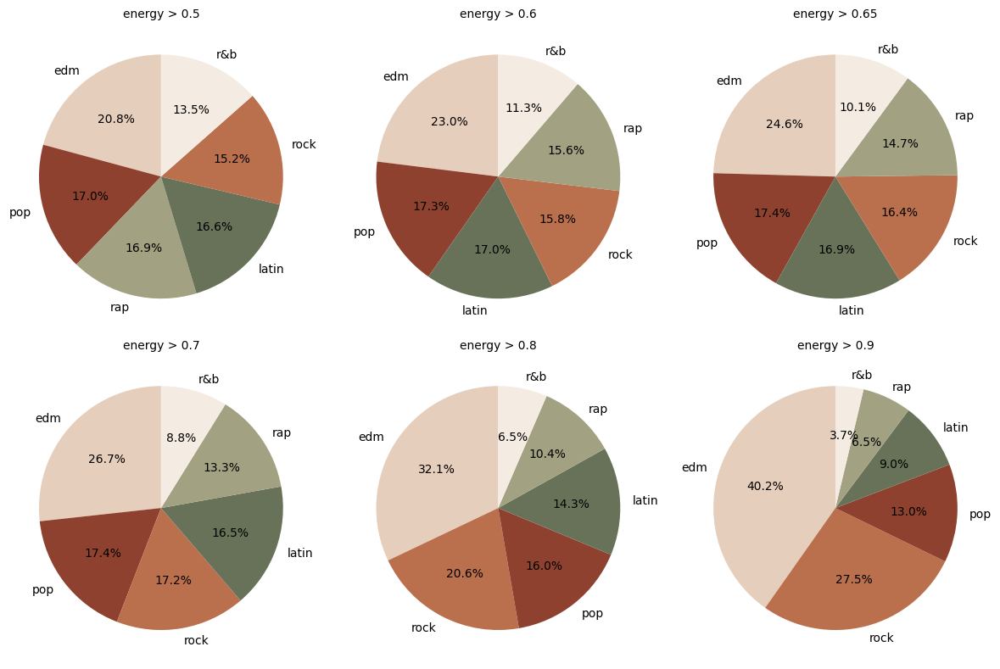

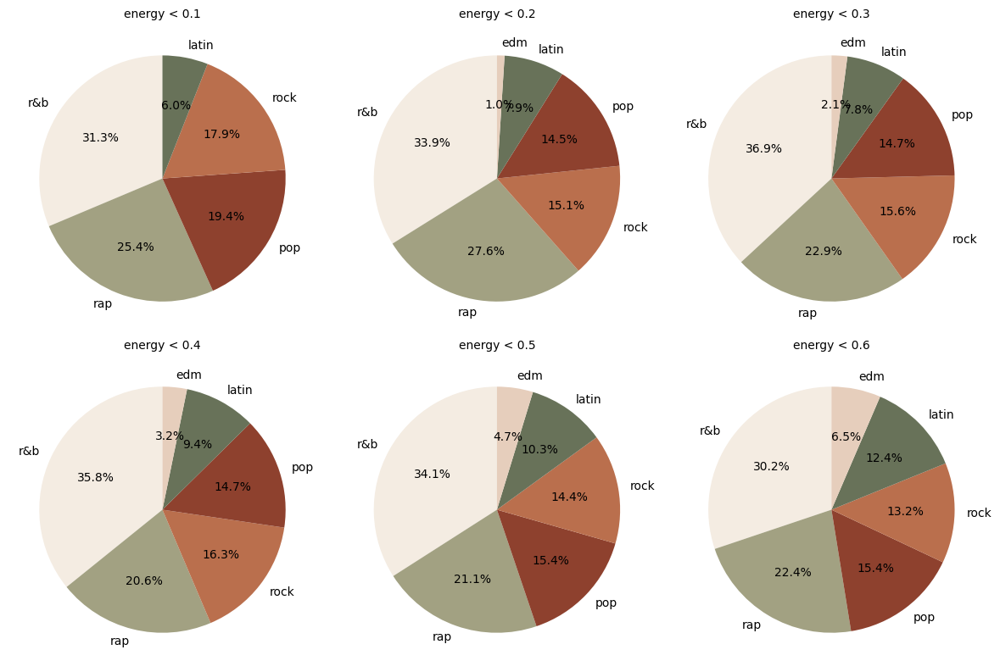

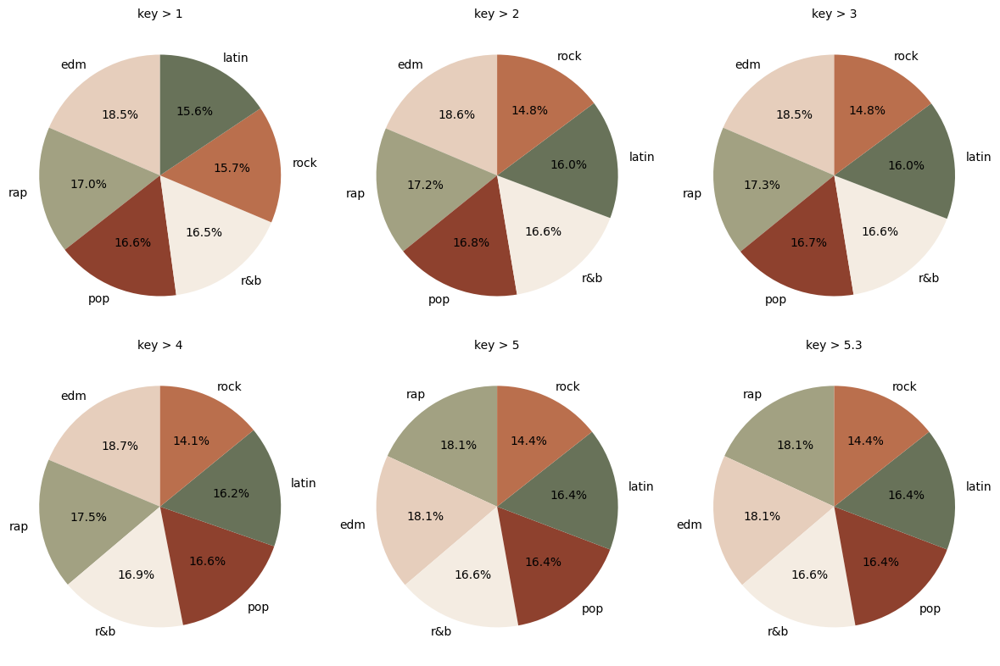

...

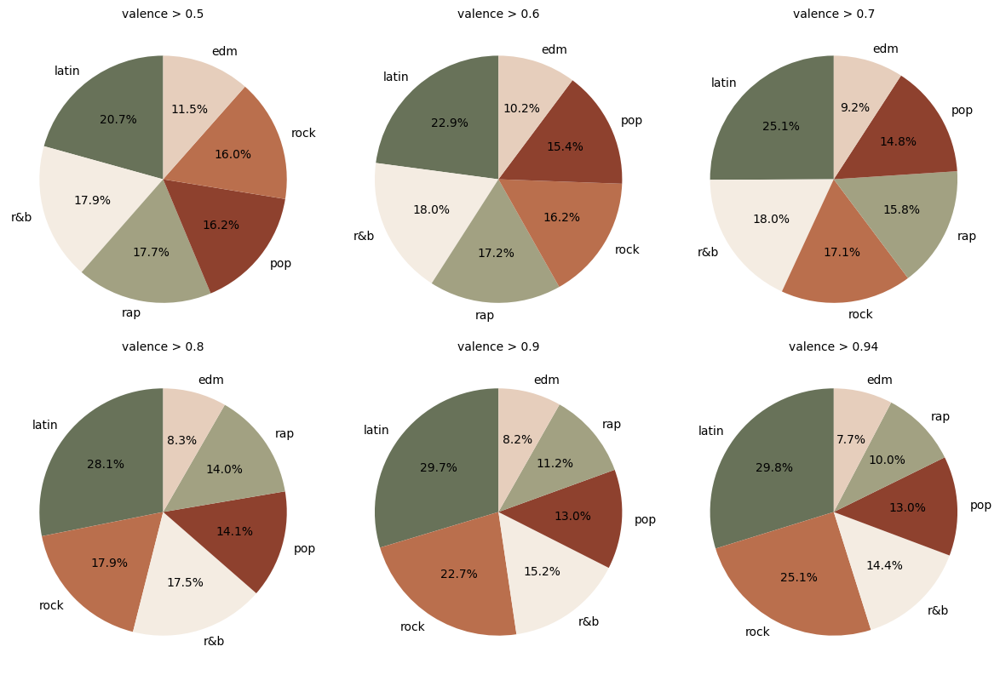

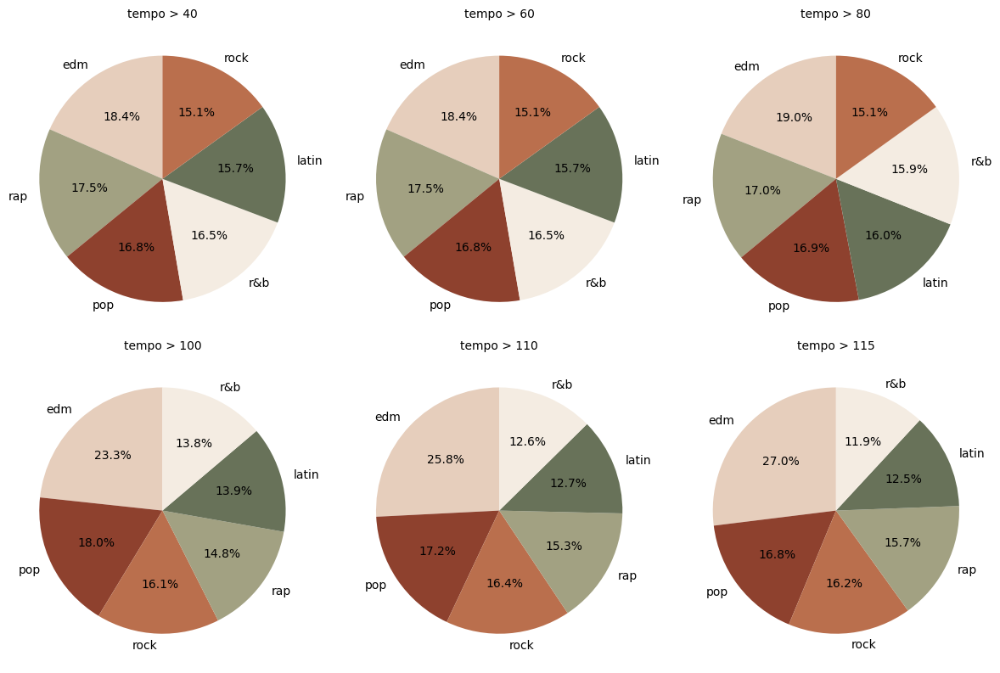

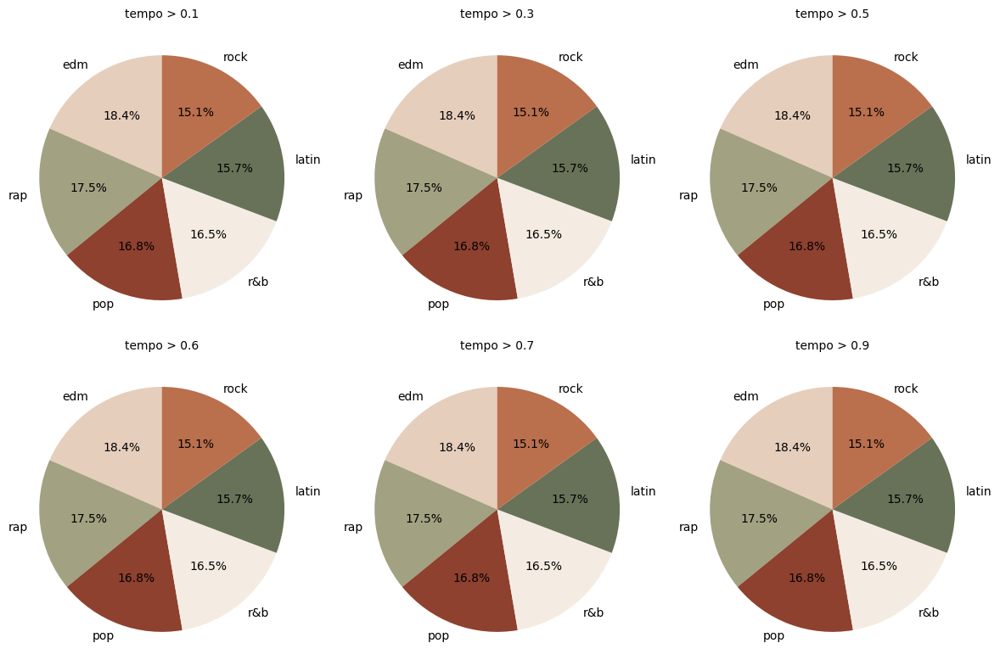

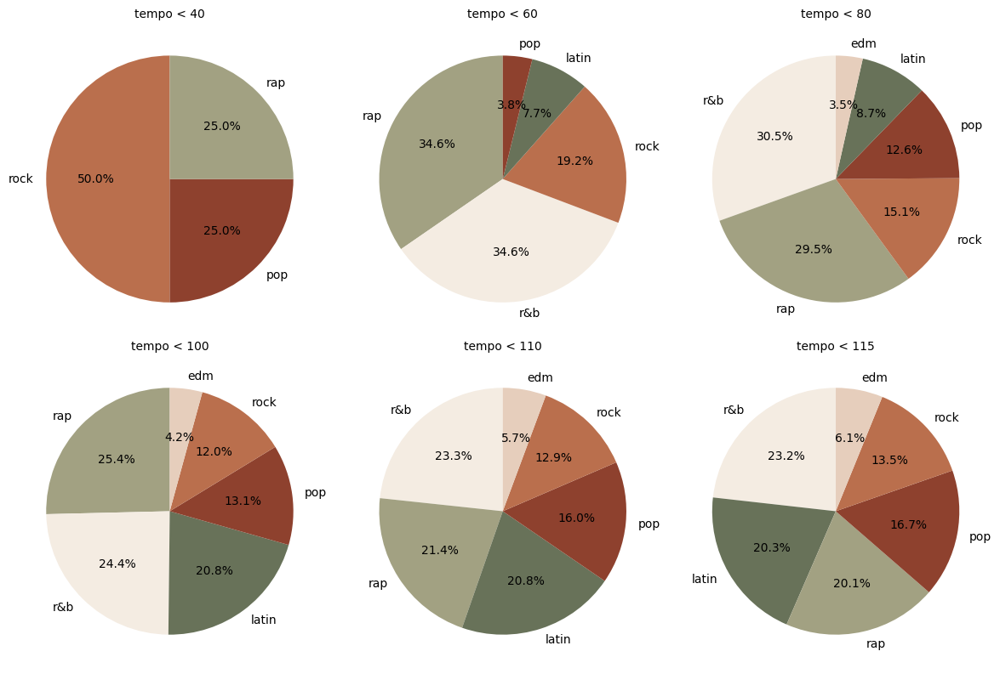

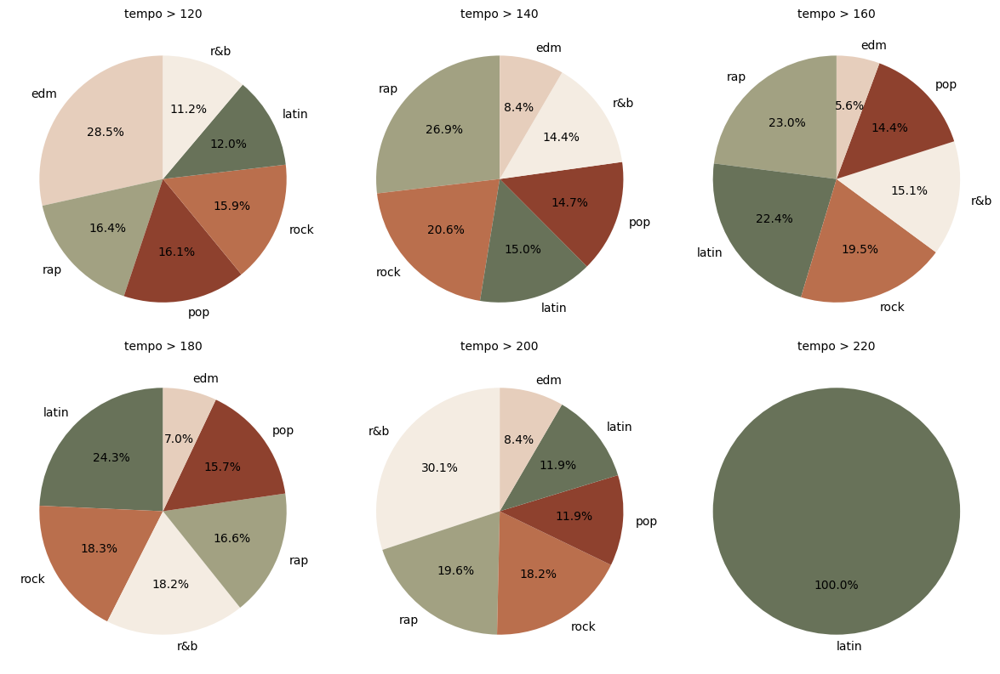

In [13]:
#danceability
#define threshold
danceability_thresh = [0.5, 0.6, 0.65, 0.7, 0.8, 0.9]

make_pie_figs_above('danceability', danceability_thresh, 3, 2)

danceability_thresh = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6]
make_pie_figs_below('danceability', danceability_thresh, 3, 2)

#energy
#define threshold
energy_thresh = [0.5, 0.6, 0.65, 0.7, 0.8, 0.9]

make_pie_figs_above('energy', energy_thresh, 3, 2)

energy_thresh = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6]
make_pie_figs_below('energy', energy_thresh, 3, 2)

#key
#define threshold
key_thresh = [1, 2, 3, 4, 5, 5.3]
make_pie_figs_above('key', key_thresh, 3, 2)
key_thresh = [5.4, 5.5, 7, 8, 9, 10,]
make_pie_figs_above('key', key_thresh, 3, 2)

key_thresh = [1, 2, 3, 4, 5, 5.3]
make_pie_figs_below('key', key_thresh, 3, 2)
key_thresh = [5.4, 5.5, 7, 8, 9, 10,]
make_pie_figs_below('key', key_thresh, 3, 2)

#loudness
#define threshold
loud_thresh = [-7, -6, -5, -4, -3, -2]

make_pie_figs_above('loudness', loud_thresh, 3, 2)

loud_thresh = [-10, -9, -8, -7, -6, -5]
make_pie_figs_below('loudness', loud_thresh, 3, 2)

#mode
#define threshold
mode_thresh = [0.1, 0.3, 0.5, 0.6, 0.7, 0.9]

make_pie_figs_above('mode', mode_thresh, 3, 2)

mode_thresh = [0.1, 0.3, 0.5, 0.6, 0.7, 0.9]
make_pie_figs_below('mode', mode_thresh, 3, 2)

#speechiness
#define threshold
speech_thresh = [0.03, 0.05, 0.07, 0.1, 0.13, 0.17]

make_pie_figs_above('speechiness', speech_thresh, 3, 2)

#mode_thresh = [0.1, 0.3, 0.5, 0.6, 0.7, 0.9]
make_pie_figs_below('speechiness', speech_thresh, 3, 2)

#acousticness
#define threshold
ac_thresh = [0.05, 0.08, 0.1, 0.2, 0.4, 0.6]

make_pie_figs_above('acousticness', ac_thresh, 3, 2)

ac_thresh = [0.001, 0.01, 0.2, 0.3, 0.4, 0.5]
make_pie_figs_below('acousticness', ac_thresh, 3, 2)

#instrumentalness
#define threshold
in_thresh = [0.01, 0.03, 0.06, 0.1, 0.2, 0.3]
make_pie_figs_above('instrumentalness', in_thresh, 3, 2)
in_thresh = [0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
make_pie_figs_above('instrumentalness', in_thresh, 3, 2)

in_thresh = [0.01, 0.03, 0.06, 0.1, 0.2, 0.3]
make_pie_figs_below('instrumentalness', in_thresh, 3, 2)
in_thresh = [0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
make_pie_figs_above('instrumentalness', in_thresh, 3, 2)

#valence
#define threshold
val_thresh = [0.01, 0.05, 0.1, 0.2, 0.3, 0.4]
make_pie_figs_above('valence', val_thresh, 3, 2)
val_thresh = [0.5, 0.6, 0.7, 0.8, 0.9, 0.94]
make_pie_figs_above('valence', val_thresh, 3, 2)

val_thresh = [0.01, 0.05, 0.1, 0.2, 0.3, 0.4]
make_pie_figs_below('valence', val_thresh, 3, 2)
val_thresh = [0.5, 0.6, 0.7, 0.8, 0.9, 0.94]
make_pie_figs_above('valence', val_thresh, 3, 2)

#tempo
#define threshold
tempo_thresh = [40, 60, 80, 100, 110, 115]
make_pie_figs_above('tempo', tempo_thresh, 3, 2)
tempo_thresh = [120, 140, 160, 180, 200, 220]
make_pie_figs_above('tempo', mode_thresh, 3, 2)

tempo_thresh = [40, 60, 80, 100, 110, 115]
make_pie_figs_below('tempo', tempo_thresh, 3, 2)
tempo_thresh = [120, 140, 160, 180, 200, 220]
make_pie_figs_above('tempo', tempo_thresh, 3, 2)

# Radar Chart

In [14]:
pip install plotly


[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [15]:
# Imports and reading data
import pandas as pd
import statistics as stat
import plotly.graph_objects as go

data = pd.read_csv("spotify_songs.csv")

# Preparing data for radar chart
genres = ['edm', 'latin', 'pop', 'r&b', 'rap', 'rock']
# Only including variables with the same scale from 0.0 to 1.0
varnames = ['danceability', 'speechiness', 'energy', 'acousticness', 'valence', 'instrumentalness']

means = [[0 for _ in range(9)] for _ in range(6)]

g = 0
for genre in genres:
    genre_data = data[data['playlist_genre'] == genres[g]][varnames]
    v = 0
    for var in varnames:
        means[g][v] = stat.mean(genre_data[var])
        v = v + 1
    g = g + 1

# Creating and displaying figure
fig = go.Figure()

for i in range(6):
    fig.add_trace(go.Scatterpolar(
        r=means[i],
        theta=varnames,
        fill='toself',
        name=genres[i]
    ))

fig.update_layout(
    polar=dict(
        radialaxis=dict(
            visible=True,
            range=[0, 1]
        )),
    showlegend=True
)

fig.update_layout(
    title=dict(text="Mean of features for each genre", font=dict(size=24), automargin=True, yref='paper')
)

fig.show()

# Models

# Logistic Regression

Classification Report:
              precision    recall  f1-score   support

         edm       0.52      0.59      0.55      1209
       latin       0.39      0.39      0.39      1031
         pop       0.32      0.23      0.27      1102
         r&b       0.41      0.34      0.37      1086
         rap       0.52      0.55      0.53      1149
        rock       0.53      0.67      0.59       990

    accuracy                           0.46      6567
   macro avg       0.45      0.46      0.45      6567
weighted avg       0.45      0.46      0.45      6567

Accuracy: 0.46


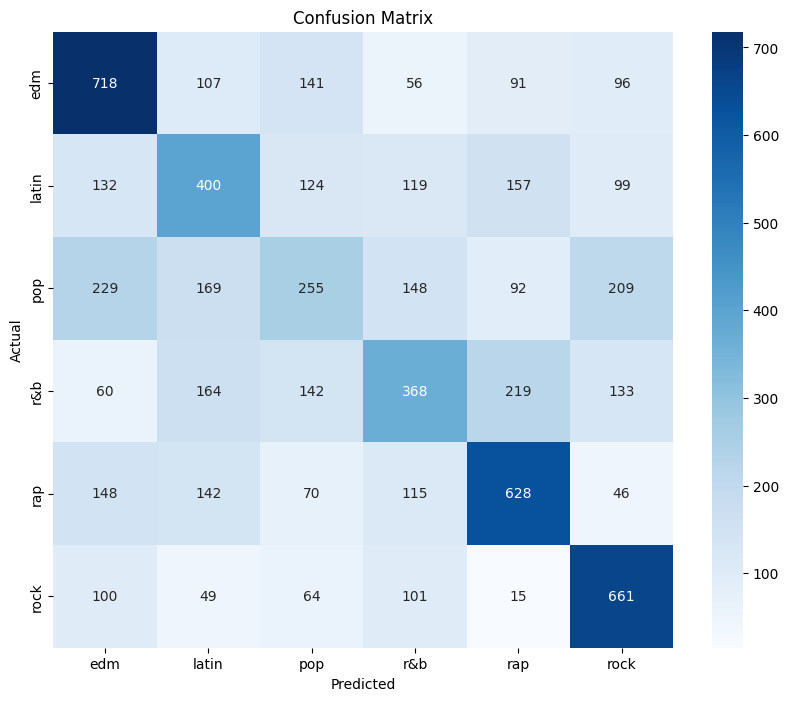

In [16]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

spotify_data = pd.read_csv("spotify_songs.csv")

features = ['danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 
            'instrumentalness', 'valence', 'tempo']
target = 'playlist_genre'

label_encoder = LabelEncoder()
spotify_data['genre_encoded'] = label_encoder.fit_transform(spotify_data[target])

X = spotify_data[features]
y = spotify_data['genre_encoded']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=features)
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=features)

log_reg = LogisticRegression(max_iter=500, solver='lbfgs', random_state=42)
log_reg.fit(X_train_scaled_df, y_train)


y_pred = log_reg.predict(X_test_scaled_df)

print("Classification Report:")
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_, zero_division=0))
print(f"Accuracy: {accuracy_score(y_test, y_pred):.2f}")

cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=label_encoder.classes_, 
            yticklabels=label_encoder.classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


# Neural Network

In [17]:
pip install tensorflow


[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


Epoch 1/30
821/821 ━━━━━━━━━━━━━━━━━━━━ 1s 535us/step - accuracy: 0.4362 - loss: 1.4393 - val_accuracy: 0.4938 - val_loss: 1.3000
Epoch 2/30
821/821 ━━━━━━━━━━━━━━━━━━━━ 0s 464us/step - accuracy: 0.4980 - loss: 1.2979 - val_accuracy: 0.5166 - val_loss: 1.2687
Epoch 3/30
821/821 ━━━━━━━━━━━━━━━━━━━━ 0s 463us/step - accuracy: 0.5070 - loss: 1.2733 - val_accuracy: 0.5251 - val_loss: 1.2509
Epoch 4/30
821/821 ━━━━━━━━━━━━━━━━━━━━ 0s 462us/step - accuracy: 0.5203 - loss: 1.2541 - val_accuracy: 0.5187 - val_loss: 1.2498
Epoch 5/30
821/821 ━━━━━━━━━━━━━━━━━━━━ 0s 461us/step - accuracy: 0.5198 - loss: 1.2415 - val_accuracy: 0.5352 - val_loss: 1.2337
Epoch 6/30
821/821 ━━━━━━━━━━━━━━━━━━━━ 0s 464us/step - accuracy: 0.5221 - loss: 1.2371 - val_accuracy: 0.5361 - val_loss: 1.2341
Epoch 7/30
821/821 ━━━━━━━━━━━━━━━━━━━━ 0s 468us/step - accuracy: 0.5272 - loss: 1.2269 - val_accuracy: 0.5376 - val_loss: 1.2320
Epoch 8/30
821/821 ━━━━━━━━━━━━━━━━━━━━ 0s 464us/step - accuracy: 0.5362 - loss: 1.2164 - 

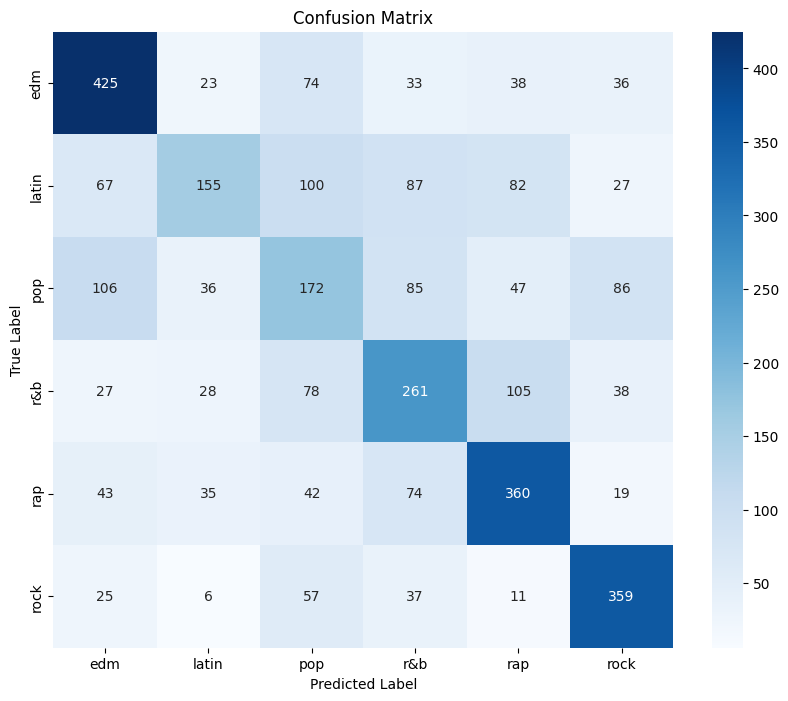

Classification Report (test dataset):
              precision    recall  f1-score   support

         edm       0.61      0.68      0.64       629
       latin       0.55      0.30      0.39       518
         pop       0.33      0.32      0.33       532
         r&b       0.45      0.49      0.47       537
         rap       0.56      0.63      0.59       573
        rock       0.64      0.73      0.68       495

    accuracy                           0.53      3284
   macro avg       0.52      0.52      0.52      3284
weighted avg       0.52      0.53      0.52      3284



In [18]:
# Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import confusion_matrix, classification_report
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense
import matplotlib.pyplot as plt
import seaborn as sns

# Load dataset
spotify_data = pd.read_csv("spotify_songs.csv")

# Selecting features and target
features = spotify_data[['danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 'instrumentalness', 'valence', 'tempo']]
target = spotify_data['playlist_genre']

# Encode the target labels as integers
label_encoder = LabelEncoder()
target_encoded = label_encoder.fit_transform(target)

# Split data into training, validation, and test sets
train_features, temp_features, train_target, temp_target = train_test_split(features, target_encoded, test_size=0.2, random_state=0)
valid_features, test_features, valid_target, test_target = train_test_split(temp_features, temp_target, test_size=0.5, random_state=0)

# Normalize features using StandardScaler
scaler = StandardScaler()
train_features = scaler.fit_transform(train_features)
valid_features = scaler.transform(valid_features)
test_features = scaler.transform(test_features)

# Define the neural network model
model = Sequential([
    Input(shape=(train_features.shape[1],)),  # Explicit Input layer
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(len(label_encoder.classes_), activation='softmax')  # Number of classes in target
])

# Compile the model
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Train the model
history = model.fit(train_features, train_target, 
                    validation_data=(valid_features, valid_target),
                    epochs=30,
                    batch_size=32,
                    verbose=1)  # Shows detailed training progress

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_features, test_target, verbose=0)
print(f"Test Accuracy: {test_accuracy:.2f}")
# Predict on the test set
test_predictions = model.predict(test_features, verbose=0)
test_predictions_classes = np.argmax(test_predictions, axis=1)

# Generate and display confusion matrix
conf_matrix = confusion_matrix(test_target, test_predictions_classes)

plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

# Print classification report
print("Classification Report (test dataset):")
print(classification_report(test_target, test_predictions_classes, target_names=label_encoder.classes_))

# Support Vector Machine

In [20]:
#selecting features (taking out key)
X_SVM = spotify[['danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 'instrumentalness', 
     'valence', 'tempo']]
#target variable
y_SVM = spotify['playlist_genre']

from sklearn.model_selection import train_test_split

X_SVM_train, X_SVM_test, y_SVM_train, y_SVM_test = train_test_split(X_SVM, y_SVM, test_size=0.2, random_state=42)

from sklearn.svm import SVC

#create and train the SVM model
svm_model = SVC(kernel='linear', C=1.0, random_state=42)
svm_model.fit(X_SVM_train, y_SVM_train)


from sklearn.metrics import classification_report, confusion_matrix
#predict on the test set
y_SVM_pred = svm_model.predict(X_SVM_test)

# Map numeric labels to genre names
y_SVM_test_named = y_SVM_test.map(genre_mapping)
y_SVM_pred_named = pd.Series(y_SVM_pred).map(genre_mapping)

#evaluation metrics
print(confusion_matrix(y_SVM_test, y_SVM_pred))
print(classification_report(y_SVM_test, y_SVM_pred, target_names=list(mycolors.keys())))


[[695 116 151  41 111 104]
 [136 387 114 122 169 105]
 [210 176 247 178  82 188]
 [ 55 154 102 369 229 122]
 [144 153  61 116 646  48]
 [108  55  72 118   8 675]]
              precision    recall  f1-score   support

         pop       0.52      0.57      0.54      1218
        rock       0.37      0.37      0.37      1033
         edm       0.33      0.23      0.27      1081
         rap       0.39      0.36      0.37      1031
       latin       0.52      0.55      0.54      1168
         r&b       0.54      0.65      0.59      1036

    accuracy                           0.46      6567
   macro avg       0.45      0.46      0.45      6567
weighted avg       0.45      0.46      0.45      6567



# K nearest neighbors

In [21]:
import pandas as pd
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier

# import dataset
data = pd.read_csv("spotify_songs.csv")

# selecting features chosen in proposal document
unscaled_features = data[['danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 'instrumentalness', 'valence', 'tempo']]
target = data['playlist_genre']

# split into 80% train/20% test data
unscaled_train_features, unscaled_test_features, train_target, test_target = train_test_split(unscaled_features, target, test_size = 0.2, random_state = 0)
# split test data into half validation/half test
unscaled_valid_features, unscaled_test_features, valid_target, test_target = train_test_split(unscaled_test_features, test_target, test_size = 0.5, random_state = 0)

# normalization/scaling
scaler = StandardScaler().set_output(transform='pandas')
features = scaler.fit_transform(unscaled_features)
train_features = scaler.fit_transform(unscaled_train_features)
valid_features = scaler.fit_transform(unscaled_valid_features)
test_features = scaler.fit_transform(unscaled_test_features)

# model training/prediction
model = KNeighborsClassifier(n_neighbors=17, weights='distance')
model.fit(train_features, train_target)
    
test_predicted = model.predict(test_features)
print("Confusion Matrix (test dataset):")
print(metrics.confusion_matrix(test_target, test_predicted))
print("Classification Report (test dataset):")
print(metrics.classification_report(test_target, test_predicted))

Confusion Matrix (test dataset):
[[398  40 100  28  37  26]
 [ 65 204  83  66  69  31]
 [103  75 168  69  36  81]
 [ 24  62  74 237  95  45]
 [ 48  58  40  78 326  23]
 [ 34  10  46  31   8 366]]
Classification Report (test dataset):
              precision    recall  f1-score   support

         edm       0.59      0.63      0.61       629
       latin       0.45      0.39      0.42       518
         pop       0.33      0.32      0.32       532
         r&b       0.47      0.44      0.45       537
         rap       0.57      0.57      0.57       573
        rock       0.64      0.74      0.69       495

    accuracy                           0.52      3284
   macro avg       0.51      0.52      0.51      3284
weighted avg       0.51      0.52      0.51      3284



# Random Forest Classifier

In [22]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from sklearn.preprocessing import LabelEncoder

# Step 1: Prepare the data
# Select the features and target variable
features = ['danceability', 'energy', 'loudness', 'speechiness', 
            'acousticness', 'instrumentalness', 'valence', 'tempo']
target = 'playlist_genre'

# Separate the features (X) and target (y)
X = spotify[features]
y = spotify[target]

# Step 2: Encode the target variable (genre) as numeric labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)  # Convert genres to numeric labels

# Step 3: Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.3, random_state=42)

# Step 4: Train the Random Forest Classifier
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
rf_classifier.fit(X_train, y_train)

# Step 5: Predict the genres on the test set
y_pred = rf_classifier.predict(X_test)

# Step 6: Evaluate the model
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=label_encoder.classes_))

# Step 7: Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print(conf_matrix)




Accuracy: 0.537766497461929

Classification Report:
               precision    recall  f1-score   support

         edm       0.64      0.68      0.66      1818
       latin       0.48      0.40      0.43      1523
         pop       0.36      0.31      0.34      1651
         r&b       0.45      0.45      0.45      1591
         rap       0.57      0.62      0.59      1742
        rock       0.65      0.75      0.70      1525

    accuracy                           0.54      9850
   macro avg       0.53      0.54      0.53      9850
weighted avg       0.53      0.54      0.53      9850

[[1233   97  263   67   91   67]
 [ 145  606  246  204  247   75]
 [ 305  193  517  251  119  266]
 [  64  159  185  722  329  132]
 [ 121  174   85  222 1075   65]
 [  55   42  133  121   30 1144]]
